In [1]:
import pandas as pd
import numpy as np
from datetime import datetime
import re
import random

#pour ne pas avoir d'erreu lors des requêtes HTTP  
from urllib.error import HTTPError
import ssl
ssl._create_default_https_context = ssl._create_unverified_context

#pour les graphiques 
import matplotlib.pyplot as plt
import seaborn as sb

#pour le bar chart animé 
from IPython.display import HTML
import matplotlib.animation as animation
import matplotlib.ticker as ticker

#Pour les graphiques "globe"
import plotly.graph_objects as go
import plotly.express as px

#Scraping des données pour les voiliers
import requests
from bs4 import BeautifulSoup

Nous allons nous intéresser aux données du Vendée Globe 2020, la plus grande course autour du monde en solitaire et à la voile.  Créée en 1989, cette course représente une prouesse technique pour les marins et leur bateau.
La 9ème édition du Vendée Globe à démarrée des Sables d'Olonne le 8 Novembre 2020  et nous allons essayer d'analyser cette édition.  
Cette analyse se fera sur les données AVANT l'arrivée des premiers voiliers.


### Extraction et nettoyage des données du classement

Voici le code utilisé pour extaire les données directement depuis la page de classement du vendée globe :   
https://www.vendeeglobe.org/fr/classement/20201108_120200

In [2]:
# #On écupère le dates du 2020-11-08 14:00:00 au 2021-01-27 14:00:00 et on test l'URL 

# list_date = [d.strftime('%Y%m%d'+'_'+'%H%M%S') for d in pd.date_range(start="2020-11-08 14:00:00", end="2021-01-27 14:00:00", freq='1H')]
# columns = ['Date', 'Rank', 'Nat/Sail', 'Skipper/Crew', 'Hour FR', 'Latitude', 'Longitude', 'Heading_30min', 'Speed_30min (Knots)', 'VMG_30min (Knots)',
#            'Distance_30min (nautical mile)', 'Heading_slrt', 'Speed_slrt (Knots)', 'VMG_slrt (Knots)', 'Distance_slrt (nautical mile)', 'Heading_24h', 'Speed_24h (Knots)', 'VMG_24h (Knots)', 'Distance_24h (nautical mile)', 'DTF (nautical mile)', 'DTL (nautical mile)']
# df = pd.DataFrame()

# for index, date in enumerate(list_date):
#     url = "https://www.vendeeglobe.org/download-race-data/vendeeglobe_"+date+".xlsx"
#     try:
#         df_link = pd.read_excel(url, skiprows=4,
#                                 names=columns, skipfooter=4)
#         df_link['Date'] = list_date[index]
#         df = pd.concat([df, df_link],ignore_index = True)
#         #df = df.append(df_link, ignore_index=True)
#     except:
#         continue

In [3]:
# #enregistrement dans un fichier excel 

# df.to_csv(r'data\vendee_globe_data.csv', index=None, header=True, encoding='utf-8')

In [4]:
df = pd.read_csv(r'data\vendee_globe_data.csv')
df.shape
df['Date'].min()
df['Date'].max()
df['Date'].nunique()  # nombre de fichiers excels

(15906, 21)

'20201108_140000'

'20210127_140000'

482

15906 lignes et 21 featues sur une plage de date du 08-11-2020 au 17-01-2021 (juste avant l'arrivée du premier skipper. Il ya 482 entrées pou chaque participant (482 fichiers récupérés)

#### Data Cleaning

In [5]:
df['Skipper/Crew'].nunique()
df.loc[df['Skipper/Crew'].str.contains('HUGO BOSS')]['Date'].count()
df.loc[df['Skipper/Crew'].str.contains('Hugo Boss')]['Date'].count()

34

470

12

Il y a 34 skipper différent d'apres notre dataframe, mais 33 sur le classement. 'Alex Thompson' apparait deux fois. 

In [6]:
df['Skipper/Crew'] = df['Skipper/Crew'].str.title()
df['Skipper/Crew'].nunique()

33

Cleaning des colonnes  
On divise les colonnes avec plusieurs informations ('Skipper / Crew', 'Nat/Sail'), on transfome la colonne date en type 'Datetime' et on transforme les colonnes numériques en type float ou int.

In [7]:
df['Sail'] = df['Nat/Sail'].apply(lambda x: re.search('(\d+)', x).group(0))
df['Nationality'] = df['Nat/Sail'].apply(
    lambda x: re.search('[a-zA-Z]{3} ', x).group(0)[:-1])
df[['Skipper', 'Crew']] = df['Skipper/Crew'].str.split('\n', expand=True)
df = df.drop(['Nat/Sail', 'Skipper/Crew'], axis=1)

In [8]:
df['Date'] = df['Date'].apply(lambda x: re.search('^(\d+)', x).group(0))
df['Hour FR'] = df['Hour FR'].str[0:5]
df['Hour FR'] = df['Hour FR'].fillna(method='ffill')
df["Date"] = df["Date"].map(str) + "_" + df["Hour FR"]
df['Date'] = df['Date'].apply(
    lambda x: pd.to_datetime(x, format='%Y%m%d_%H:%M'))
df = df.drop('Hour FR', axis=1)

Réorganisation des colonnes

In [9]:
df = df[['Date',
         'Rank',
         'Skipper',
         'Crew',
         'Nationality',
         'Sail',
         'Latitude',
         'Longitude',
         'Heading_30min',
         'Speed_30min (Knots)',
         'VMG_30min (Knots)',
         'Distance_30min (nautical mile)',
         'Heading_slrt',
         'Speed_slrt (Knots)',
         'VMG_slrt (Knots)',
         'Distance_slrt (nautical mile)',
         'Heading_24h',
         'Speed_24h (Knots)',
         'VMG_24h (Knots)',
         'Distance_24h (nautical mile)',
         'DTF (nautical mile)',
         'DTL (nautical mile)',
         ]]

Slicing des colonnes pou garder seulement les valeurs numériques

In [10]:
columns_heading = ['Heading_30min', 'Heading_slrt', 'Heading_24h']
columns_speed = ['Speed_30min (Knots)', 'VMG_30min (Knots)', 'Speed_slrt (Knots)',
                 'Speed_24h (Knots)', 'VMG_24h (Knots)', 'VMG_slrt (Knots)']
column_distance = ['Distance_30min (nautical mile)', 'Distance_slrt (nautical mile)',
                   'Distance_24h (nautical mile)', 'DTF (nautical mile)', 'DTL (nautical mile)']

In [11]:
df[columns_heading] = df[columns_heading].applymap(lambda x: str(x)[0:-1])
df[columns_speed] = df[columns_speed].applymap(lambda x: str(x)[0:-4])
df[column_distance] = df[column_distance].applymap(lambda x: str(x)[0:-3])

Etudes et remplacement des cellules NaN

In [12]:
df = df.replace(r'^na', np.NaN, regex=True)
df = df.replace(r'^\s*$', np.nan, regex=True)

In [13]:
df[columns_speed] = df[columns_speed].fillna('0.0')

In [14]:
df['Rank'].unique()

array(['1', '2', '3', '4', '5', '6', '7', '8', '9', '10', '11', '12',
       '13', '14', '15', '16', '17', '18', '19', '20', '21', '22', '23',
       '24', '25', '26', '27', '28', '29', '30', '31', 'NL', '32', '33',
       'RET'], dtype=object)

On renseigne des valeurs par défaut pour les skippers sans information sur leur première ligne et on applique la méthode 'ffill' 
on prend par exemple les coordonnées des Sables-d'Olonne pour leur position de départ 

In [15]:
df.loc[(df['Rank'] == 'NL') & (df['Skipper'] == 'Arnaud Boissieres') &
       (df['Date'] == '2020-11-08 15:30:00'), 'Latitude'] = "46°29.34'N"
df.loc[(df['Rank'] == 'NL') & (df['Skipper'] == 'Arnaud Boissieres') & (
    df['Date'] == '2020-11-08 15:30:00'), 'Longitude'] = "01°46.49'W"
df.loc[(df['Rank'] == 'NL') & (df['Skipper'] == 'Arnaud Boissieres') & (
    df['Date'] == '2020-11-08 15:30:00'), 'DTF (nautical mile)'] = 24296.6
df.loc[(df['Rank'] == 'NL') & (df['Skipper'] == 'Arnaud Boissieres') & (
    df['Date'] == '2020-11-08 15:30:00'), 'Distance_24h (nautical mile)'] = 0
df.loc[(df['Rank'] == 'NL') & (df['Skipper'] == 'Arnaud Boissieres') & (
    df['Date'] == '2020-11-08 15:30:00'), 'Distance_slrt (nautical mile)'] = 0
df.loc[(df['Rank'] == 'NL') & (df['Skipper'] == 'Arnaud Boissieres')
       & (df['Date'] == '2020-11-08 15:30:00'), 'Rank'] = 33

In [16]:
df.loc[(df['Rank'] == 'NL') & (df['Skipper'] == 'Charlie Dalin') & (
    df['Date'] == '2020-11-08 15:30:00'), 'Latitude'] = "46°29.34'N"
df.loc[(df['Rank'] == 'NL') & (df['Skipper'] == 'Charlie Dalin') & (
    df['Date'] == '2020-11-08 15:30:00'), 'Longitude'] = "01°46.49'W"
df.loc[(df['Rank'] == 'NL') & (df['Skipper'] == 'Charlie Dalin') & (
    df['Date'] == '2020-11-08 15:30:00'), 'DTF (nautical mile)'] = 24296.6
df.loc[(df['Rank'] == 'NL') & (df['Skipper'] == 'Charlie Dalin') & (
    df['Date'] == '2020-11-08 15:30:00'), 'Distance_24h (nautical mile)'] = 0
df.loc[(df['Rank'] == 'NL') & (df['Skipper'] == 'Charlie Dalin') & (
    df['Date'] == '2020-11-08 15:30:00'), 'Distance_slrt (nautical mile)'] = 0
df.loc[(df['Rank'] == 'NL') & (df['Skipper'] == 'Charlie Dalin')
       & (df['Date'] == '2020-11-08 15:30:00'), 'Rank'] = 32

RET = Rank de 34, ici le 34 est pris pour que le skipper qui a abandonner soit le dernier du classement, ex aequo avec les autres skippers ayant abandonnés  

In [17]:
df = df.replace(r'NL', np.nan)
df = df.replace(r'RET', '34')

In [18]:
list_skipper = (df['Skipper'].unique()).tolist()

In [19]:
for skipper in list_skipper:
    df.loc[df['Skipper'] == skipper] = df.loc[df['Skipper'] == skipper].fillna(method='ffill')

Je remplace les 'Heading'  avec des NaN par 0

In [20]:
df[columns_heading] = df[columns_heading].replace(np.nan, 0)

Je convertis toutes les colonnes numériques en float ou int

In [21]:
df[columns_speed] = df[columns_speed].applymap(lambda x: float(x))
df[columns_heading] = df[columns_heading].applymap(lambda x: float(x))
df[column_distance] = df[column_distance].applymap(lambda x:  float(x))
df['Rank'] = df['Rank'].apply(lambda x:  int(x))

Fonction pour convertir les dms en dd prise sur : https://en.proft.me/2015/09/20/converting-latitude-and-longitude-decimal-values-p/

In [22]:
def dms2dd(degrees, minutes, seconds, direction):
    dd = float(degrees) + float(minutes)/60 + float(seconds)/(60*60)
    if direction == 'W' or direction == 'S':
        dd *= -1
    return dd


def dd2dms(deg):
    d = int(deg)
    md = abs(deg - d) * 60
    m = int(md)
    sd = (md - m) * 60
    return [d, m, sd]


def parse_dms(dms):
    parts = re.split('[^\d\w]+', dms)
    coord = dms2dd(parts[0], parts[1], parts[2], parts[3])

    return coord

Convertion des Longitudes et Latitudes de dms à dd

In [23]:
df['Longitude_dd'] = df['Longitude'].apply(lambda x:  parse_dms(x))
df['Latitude_dd'] = df['Latitude'].apply(lambda x:  parse_dms(x))

Calul de la distance parourue pou chaque skipper

In [24]:
DISTANCE = 24296.6
df['Distance Traveled'] = DISTANCE - df['DTF (nautical mile)']

Ajout d'une colonne 'Day' correspondant au jour

In [25]:
df['Day'] = (df['Date'].apply(lambda x: re.search('[^ ]*', str(x)).group(0)))

Enegistrement dans un Excel 

In [26]:
# df.to_excel(r"data/Vendee_Globe_Clean_Data.xlsx",index=False)

### Extraction et nettoyage des données des voiliers 

In [27]:
url = 'https://www.vendeeglobe.org/fr/glossaire'
r = requests.get(url)
content = r.content.decode('utf-8')
soup = BeautifulSoup(content)
info_boats = {}

sails_info = soup.find_all('div', {'class' : "boats-list__popup-infos"})
for sail in sails_info:
    Crew = sail.find('h3', {'class':'boats-list__popup-title'}).text.title()
    lists_li = sail.find_all('li')
    info = {}
    
    for li in lists_li:
        key = li.get_text().split(':')[0]
        value = li.get_text().split(':')[1]
        info[key] = value
        info_boats[Crew] = info

In [28]:
df_boats = pd.DataFrame(list(info_boats.items()),  columns = ['Crew', 'Info'])
df_boats = pd.concat([df_boats['Crew'],df_boats["Info"].apply(pd.Series)], axis = 1)

In [29]:
#correction des valeurs érronées 
df_boats.loc[df_boats['Crew'] == "Linkedout",'Numéro de voile '] = 59
df_boats.loc[df_boats['Crew'] == "Seaexplorer - Yacht Club De Monaco",'Numéro de voile '] = 10
df_boats.loc[df_boats['Crew'] == "Medallia",'Numéro de voile '] = 777

#unification des valeurs de la colonnes 'Nombre de dérives'
df_boats.loc[df_boats['Crew'] == "Arkea Paprec",'Nombre de dérives '] = 'foils'
df_boats.loc[df_boats['Nombre de dérives '].str.contains('foils'),'Nombre de dérives '] = 'foils'
df_boats.loc[df_boats['Nombre de dérives '].str.contains('2'),'Nombre de dérives '] = 'dérives'

Nettoyage des valeurs 

In [30]:
df_boats['Longueur '] = df_boats['Longueur '].str.replace(',','.')
df_boats['Largeur '] = df_boats['Largeur '].str.replace(',','.')
df_boats['Tirant d\'eau '] = df_boats['Tirant d\'eau '].str.replace(',','.')
df_boats['Hauteur mât '] = df_boats['Hauteur mât '].str.replace(',','.')

In [31]:
df_boats['Sail'] = df_boats['Numéro de voile '].apply(lambda x: re.search('(\d+)', str(x)).group(0))
df_boats['Sail'] = df_boats['Sail'].apply(lambda x: int(x))

df_boats['Déplacement (poids) '] = df_boats['Déplacement (poids) '].apply(lambda x: str(x))
df_boats['Déplacement (poids) '] = df_boats['Déplacement (poids) '].str.replace('nc', '0.0')
df_boats['Déplacement (poids) '] = df_boats['Déplacement (poids) '].str.replace('NC', '0.0')
df_boats['Déplacement (poids (t))'] = (df_boats['Déplacement (poids) '].str.split(r'[a-zA-Z]')).str[0]
df_boats['Déplacement (poids (t))'] = df_boats['Déplacement (poids (t))'].str.replace(',','.')
df_boats['Déplacement (poids (t))'] = df_boats['Déplacement (poids (t))'].apply(lambda x: float(x))
df_boats['Déplacement (poids (t))'] = df_boats['Déplacement (poids (t))'].replace(0.0, np.nan)

df_boats['Longueur (m)'] = df_boats['Longueur '].apply(lambda x: re.search('[^ |[a-zA-Z]+]*', str(x)).group(0))
df_boats['Largeur (m)'] = df_boats['Largeur '].apply(lambda x: re.search('[^ |[a-zA-Z]+]*', str(x)).group(0))
df_boats['Tirant d\'eau (m)'] = df_boats['Tirant d\'eau '].apply(lambda x: re.search('[^ |[a-zA-Z]+]*', str(x)).group(0))
df_boats['Hauteur mât (m)'] = df_boats['Hauteur mât '].apply(lambda x: re.search('[^ |[a-zA-Z]+]*', str(x)).group(0))
df_boats['Surface de voiles au près (m2)'] = df_boats['Surface de voiles au près '].apply(lambda x: re.search('[^ |[a-zA-Z].]*', str(x)).group(0))
df_boats['Surface de voiles au portant (m2)'] = df_boats['Surface de voiles au portant '].apply(lambda x: re.search('[^ |[a-zA-Z].]*', str(x)).group(0))

In [32]:
#On supprime la colonne 'Anciens noms du bateau ' qui n'est pas utile
df_boats = df_boats.drop('Anciens noms du bateau ', axis=1) 

In [33]:
#réorganisation des colonnes 
df_boats = df_boats[['Sail','Crew', 'Architecte ', 'Chantier ', 'Date de lancement ',
       'Nombre de dérives ', 'Voile quille ',
       'Longueur (m)', 'Largeur (m)', 'Tirant d\'eau (m)', 'Hauteur mât (m)',
       'Surface de voiles au près (m2)', 'Surface de voiles au portant (m2)',
       'Déplacement (poids (t))']]

In [34]:
#transformation des vealeurs en valeur numériques
df_boats[['Longueur (m)', 'Largeur (m)', 'Tirant d\'eau (m)', 'Hauteur mât (m)',
          'Surface de voiles au près (m2)', 'Surface de voiles au portant (m2)',
          'Déplacement (poids (t))']] = df_boats[['Longueur (m)', 'Largeur (m)', 'Tirant d\'eau (m)', 'Hauteur mât (m)',
                                                  'Surface de voiles au près (m2)', 'Surface de voiles au portant (m2)',
                                                  'Déplacement (poids (t))']].applymap(lambda x: float(x))

In [35]:
# #enregistrement dans un fchier excel

# df_boats.to_excel(r"data/Boats_Data.xlsx",index = False)  

#### Merge des deux dataframes et enregistrement dans un fichier excel 

In [36]:
df_boats = pd.read_excel(r'data\Boats_Data.xlsx')
df = pd.read_excel(r'data\Vendee_Globe_Clean_Data.xlsx')
df_all = pd.merge(df, df_boats, on="Sail",how="left")
# df_all.to_excel(r"DATA/Vendee_Globe_Clean_Data_with_boats.xlsx",index = False)  

In [37]:
df_all.head()
df_all.shape

,Date,Rank,Skipper,Crew_x,Nationality,Sail,Latitude,Longitude,Heading_30min,Speed_30min (Knots),...,Date de lancement,Nombre de dérives,Voile quille,Longueur (m),Largeur (m),Tirant d'eau (m),Hauteur mât (m),Surface de voiles au près (m2),Surface de voiles au portant (m2),Déplacement (poids (t))
0,2020-11-08 15:30:00,1,Louis Burton,Bureau Vallée 2,FRA,18,46°24.46'N,01°50.48'W,241,17.7,...,09 Juin 2015,foils,acier,18.28,5.80,4.5,28.0,30,60,7.6
1,2020-11-08 15:31:00,2,Boris Herrmann,Seaexplorer - Yacht Club De Monaco,MON,10,46°24.34'N,01°49.82'W,241,11.1,...,07 Août 2015,foils,acier,18.28,5.70,4.5,29.0,29,49,7.6
2,2020-11-08 15:30:00,3,Jérémie Beyou,Charal,FRA,8,46°24.91'N,01°49.99'W,244,15.5,...,18 Août 2018,foils,acier,18.28,5.85,4.5,29.0,32,60,8.0
3,2020-11-08 15:30:00,4,Thomas Ruyant,Linkedout,FRA,59,46°24.71'N,01°49.68'W,244,13.2,...,03 Septembre 2019,foils,acier forgé,18.28,5.85,4.5,29.0,35,56,8.0
4,2020-11-08 15:30:00,5,Maxime Sorel,V And B Mayenne,FRA,53,46°24.59'N,01°49.56'W,246,10.9,...,07 Septembre 2007,dérives,acier,18.28,5.50,4.5,29.0,36,70,7.7


(15906, 39)

### Analyse des données 

#### Affihage des trajectoires des difféents skippers

Nous pouvons commencer par afficher les trajets de chaque skipper 

In [38]:
#Il est possible de selectionner un  ou plusieurs skippers en cliquant sur leur nom dans la légende 

fig = px.line_geo(df, lat=df['Latitude_dd'], lon=df['Longitude_dd'],
                  color=df['Skipper'],
                  projection="orthographic", hover_name=df['Date'], title='Visualisaion de trajectoires des différents Skipper', width=900, height=1000)
fig.show()

L'étude plus approfondie des trajetoires permet de mettre en évidence les passages difficiles de ce vendée globe. Sur le graphique si dessous nous pouvons voir un point (au sud de l'Afrique) ou a eu lieu la majorité des abandons. Il s'agit en effet d'un passage réputé pour être difficile à traverser, le cap de Bonne-Espérance.

In [39]:
list_RET = df.loc[df['Rank']==34]['Skipper'].unique().tolist()
df_RET = df.loc[df['Skipper'].isin(list_RET)]

fig = go.Figure()

for skipper in list_RET:
    fig.add_trace(
        go.Scattergeo(
            name = f'Parcours de {skipper}',
            hoverinfo = 'text',
            text =df_RET.loc[df_RET['Skipper'] == skipper]['Date'],
            lon = df_RET.loc[df_RET['Skipper'] == skipper]['Longitude_dd'],
            lat = df_RET.loc[df_RET['Skipper'] == skipper]['Latitude_dd'],
            mode = 'lines',
            line = dict(width = 2)
        )
    )   


df_map_sauvetage = df_RET.loc[df['Date'] == '2021-01-27 14:30:00']  
fig.add_trace(go.Scattergeo(
    name = 'Abandon',
    lon = df_map_sauvetage['Longitude_dd'],
    lat = df_map_sauvetage['Latitude_dd'],
    text = df_map_sauvetage['Skipper'],
    mode = 'markers',
    marker = dict(
        size = 10,
        color = 'rgb(255, 0, 0)',
        line = dict(
            width = 3,
            color = 'rgba(231, 76, 60)'
        )
    )))


fig.update_layout(width = 1000, height = 1000,
    title_text = 'Pacous de Skippers',
    showlegend = True,
    geo = dict(
        showland = True,
        showcountries = True,
        showocean = True,
        landcolor = 'rgb(188, 188, 188 )',
        lakecolor = 'rgb(244, 244, 244 )',
        oceancolor = 'rgb(244, 244, 244 )',
        projection = dict(
            type = 'orthographic',
        )
    )
    )   
    
fig.show();

Nou pouvons aussi mettre en évidence les sauvetages de certains Skippers comme ici, le sauvetage de Kevin Escoffier par Jean Le Cam

In [40]:
# Sauvetage de Kevin Escoffier par Jean Le Cam le 30/11/2020
df_map = df.loc[(df['Skipper'] == 'Kevin Escoffier')|(df['Skipper'] == 'Jean Le Cam')]
df_map_sauvetage = df.loc[(df['Skipper'] == 'Kevin Escoffier') & (df['Date'] == '2021-01-27 14:30:00')]

fig = go.Figure()

fig.add_trace(
    go.Scattergeo(
        name = 'Parcours de Jean Le Cam',
        hoverinfo = 'text',
        text = df_map.loc[(df_map['Skipper'] == 'Jean Le Cam')]['Date'],
        lon = df_map.loc[(df_map['Skipper'] == 'Jean Le Cam')]['Longitude_dd'],
        lat = df_map.loc[(df_map['Skipper'] == 'Jean Le Cam')]['Latitude_dd'],
        mode = 'lines',
        line = dict(width = 3,color = 'rgb(255, 195, 0)')
    )
)   

fig.add_trace(
    go.Scattergeo(
        hoverinfo = 'text',
        text = df_map.loc[(df_map['Skipper'] == 'Kevin Escoffier')]['Date'],
        name = 'Parcours de Kevin Escoffier',
        lon = df_map.loc[(df_map['Skipper'] == 'Kevin Escoffier')]['Longitude_dd'],
        lat = df_map.loc[(df_map['Skipper'] == 'Kevin Escoffier')]['Latitude_dd'],
        mode = 'lines',
        line = dict(width = 3,color = 'rgb(52, 152, 219)')
    )
) 

df_map_sauvetage = df.loc[(df['Skipper'] == 'Kevin Escoffier') & (df['Date'] == '2021-01-27 14:30:00')]  

fig.add_trace(go.Scattergeo(
    name = 'Point de sauvetage',
    lon = df_map_sauvetage['Longitude_dd'],
    lat = df_map_sauvetage['Latitude_dd'],
    text = df_map_sauvetage['Skipper'],
    mode = 'markers',
    marker = dict(
        size = 10,
        color = 'rgb(255, 0, 0)',
        line = dict(
            width = 3,
            color = 'rgba(231, 76, 60)'
        )
    )))


fig.update_layout(width = 1000, height = 1000,
    title_text = 'Sauvetage de Kevin Escoffier',
    showlegend = True,
    geo = dict(
        showland = True,
        showcountries = True,
        showocean = True,
        landcolor = 'rgb(188, 188, 188 )',
        lakecolor = 'rgb(244, 244, 244 )',
        oceancolor = 'rgb(244, 244, 244 )',
        projection = dict(
            type = 'orthographic',
        )
    )
    )   
    
fig.show();

In [41]:
colors = dict(zip(
    ['Louis Burton', 'Boris Herrmann', 'Jérémie Beyou', 'Thomas Ruyant', 'Maxime Sorel', 'Fabrice Amedeo', 'Jean Le Cam', 'Alex Thomson', 'Sébastien Destremau', 'Pip Hare', 'Kevin Escoffier', 'Stéphane Le Diraison', 'Romain Attanasio', 'Damien Seguin', 'Clément Giraud', 'Samantha Davies', 'Yannick Bestaven',
        'Giancarlo Pedote', 'Kojiro Shiraishi', 'Nicolas Troussel', 'Manuel Cousin', 'Clarisse Cremer', 'Alan Roura', 'Didac Costa', 'Benjamin Dutreux', 'Armel Tripon', 'Alexia Barrier', 'Isabelle Joschke', 'Sébastien Simon', 'Miranda Merron', 'Ari Huusela', 'Charlie Dalin', 'Arnaud Boissieres'],
    ['#DD3E41','#FFAB42','#FFDF42','#B2F25F','#5FF294','#74FEE4','#74D8FE','#74A5FE','#696CFF','#A169FF','#CB69FF','#FC69FF','#FF69AE','#FF697A','#69B72C','#DFB7D5','#BCD7D5','#676673','#FFCD36','#D0F1EB','#4D2482','#862716','#22a784','#29788e','#e06461','#ca4678','#42be71','#8f0da3','#00316f','#BD1345','#980000','#9900ff','#fce5cd','#ea9999']));

In [42]:
df_groupby = df.groupby(['Day', 'Skipper']).last().sort_index()
df_groupby = df_groupby.reset_index()

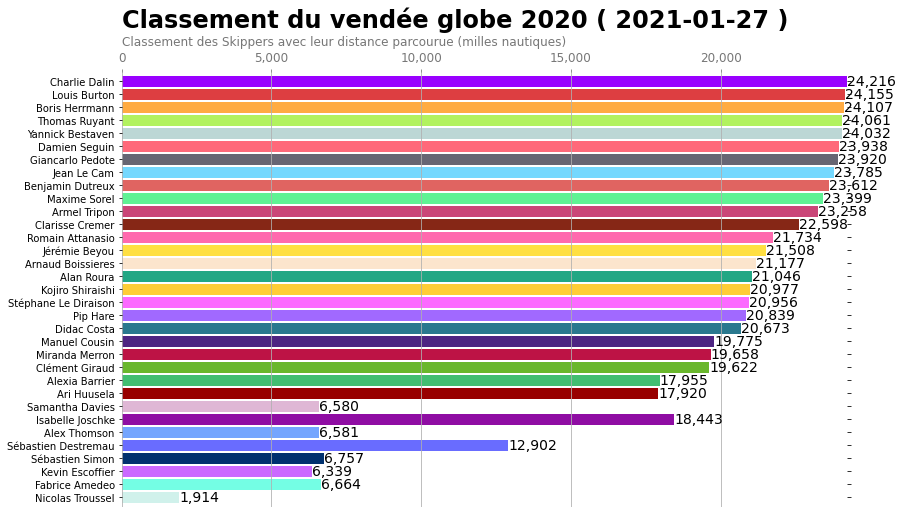

In [43]:
group_lk = df.set_index('Sail')['Skipper'].to_dict();
fig, ax = plt.subplots(figsize=(13, 8));
def draw_barchart(date):
    dff = df_groupby[df_groupby['Day'].astype(str).str.contains(date)].sort_values(by='Rank', ascending=False);
    ax.clear();
    ax.barh(dff['Skipper'], dff['Distance Traveled'], color=[colors[group_lk[x]] for x in dff['Sail']]);
    for i, (distance, name, nat) in enumerate(zip(dff['Distance Traveled'], dff['Skipper'], dff['Nationality'])):
         ax.text(distance, i,     f'{distance:,.0f}',  size=14, va = 'center', ha='left');
    ax.text(0, 1.06, 'Classement des Skippers avec leur distance parcourue (milles nautiques)', transform=ax.transAxes, size=12, color='#777777');
    ax.xaxis.set_major_formatter(ticker.StrMethodFormatter('{x:,.0f}'));
    ax.xaxis.set_ticks_position('top');
    ax.tick_params(axis='x', colors='#777777', labelsize=12);
    ax.margins(0, 0.01);
    ax.grid(which='major', axis='x', linestyle='-');
    ax.text(0, 1.15, f'Classement du vendée globe 2020 ( {date} )',
            transform=ax.transAxes, size=24, weight=600, ha='left', va='top');
    plt.box(False);
    
draw_barchart('2021-01-27');

Le diagramme bar ci-dessus montre le classemen des Skipper au 27 janvier 2021 (juste avant l'arrivée du premier skipper)
Le grphique ci-dessous est une animation de ce classement jour par jour. Il permet de suivre l'évolution du classement et des distances parcourues. 

In [44]:
list_day = df['Day'].unique()
fig, ax = plt.subplots(figsize=(14, 7));
animator = animation.FuncAnimation(fig, draw_barchart, frames=list_day);
HTML(animator.to_jshtml())
plt.close()

On peut y voir une chose assez étrange, le skipper "Fabrice Amedeo" passe de 24 nm à -2 nm. La distance parcourue est calculée en fonction de DTF (Distance to finish). Un distance parcourue négative peut donc s'expliquer par un passage à contre sens. Si nous egardons la trajectoire de Fabrice Amedeo au début du parcour nous voyons en effet qu'il a du retourner au point de départ.

In [45]:
df_fab_amadeo = df.loc[(df['Skipper'] == 'Fabrice Amedeo')&(df['Day'] < '2020-11-12')]

fig = px.line_geo(df_fab_amadeo, lat= 'Latitude_dd', lon='Longitude_dd', hover_name= df_fab_amadeo['Date'], title='Trajectoire de Fabrice Amedeo', width=900, height=1000)
fig.update_geos(fitbounds="locations")


### Analyse Statistique

Dans las suite de cette analyse, nous allons essayer de mettre en évidence les caractéristiques des bateaux qui peuvent expliquer la différence de perfomance ente tous e Skipper. Nous allons nous concentrer sur la présence ou non de foils.
Nous lon donc nou servir des données de la page: https://www.vendeeglobe.org/fr/glossaire  que nous avons extrait au début.

In [46]:
# df_boats = pd.read_excel(r'DATA\Boats_Data.xlsx')
# df_all = pd.merge(df, df_boats, on="Sail",how="left")
# # df_all.to_excel(r"DATA/Vendee_Globe_Clean_Data_with_boats.xlsx",index = False)  

In [47]:
df_No_RET = df_all.drop(df_all.index[df['Rank'] == 34])

In [48]:
# df_all['Day'] = (df_all['Date'].apply(lambda x: re.search('[^ ]*', str(x)).group(0)))
df_groupby_all = df_No_RET.groupby(['Day', 'Skipper']).last().sort_index()
df_groupby_all = df_groupby_all.reset_index()

In [49]:
df_gb = df_all.groupby(['Sail']).last()[['Skipper','Nombre de dérives ']]

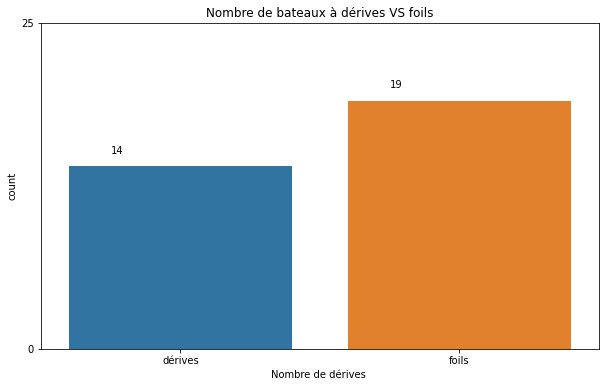

In [50]:
fig, ax = plt.subplots(figsize = (10,6));
sb.countplot(x = "Nombre de dérives " , data = df_gb)
plt.title('Nombre de bateaux à dérives VS foils')
ax.set_yticks(np.arange(0, 40, 25))
for p in ax.patches:
    ax.annotate(f'{p.get_height()}', (p.get_x()+0.15, p.get_height()+1))
plt.show();

On peut tout d'abord remarquer qu'il y a plus de bateau à foils qu'à dérives

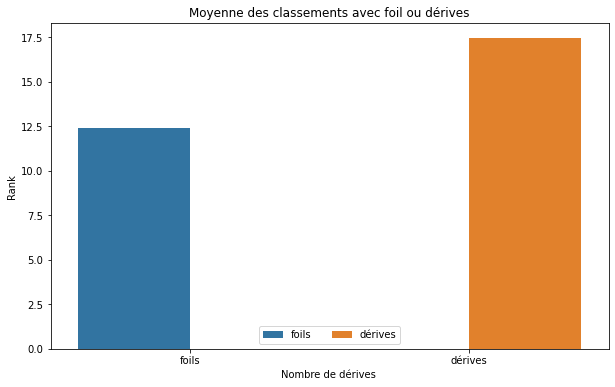

In [51]:
fig, ax = plt.subplots(figsize = (10,6));
sb.barplot(x="Nombre de dérives ", y='Rank', hue="Nombre de dérives ", data=df_No_RET, ci = None,ax=ax);
ax.legend(ncol = 2, loc = 'lower center');
plt.title('Moyenne des classements avec foil ou dérives')
plt.show();

En moyenne, les voiliers avec foils sont mieux classés que les voiliers à dérives.

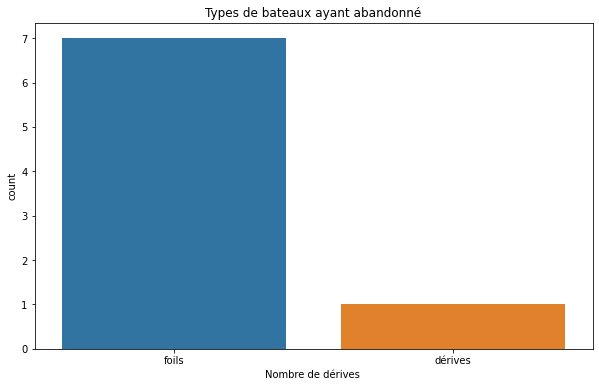

In [52]:
df_RET = df_all.loc[df_all['Skipper'].isin(list_RET)][['Skipper','Nombre de dérives ']]
df_RET = df_RET.drop_duplicates()

fig, ax = plt.subplots(figsize = (10,6));

sb.countplot(x = "Nombre de dérives " , data = df_RET)

plt.title('Types de bateaux ayant abandonné')
plt.show();

Parmis les abandons, un seul est un bateau avec dérives et 7 (87%) sont avec foils.  

Nous pouvons aussi étudier le differentes vitesse des ces bateaux voirs si le foil a un impact dessus.  
Nous commençons par regarder la VMG_slrt « Velocity Made Good » , c'est à dire a combinaison de la vitesse du bateau sur l’eau ainsi que l’angle de remontée du bateau au vent. Elle permet de connaitre le meilleur rapport Vitesse/Angle de CAP pour atteindre un point.

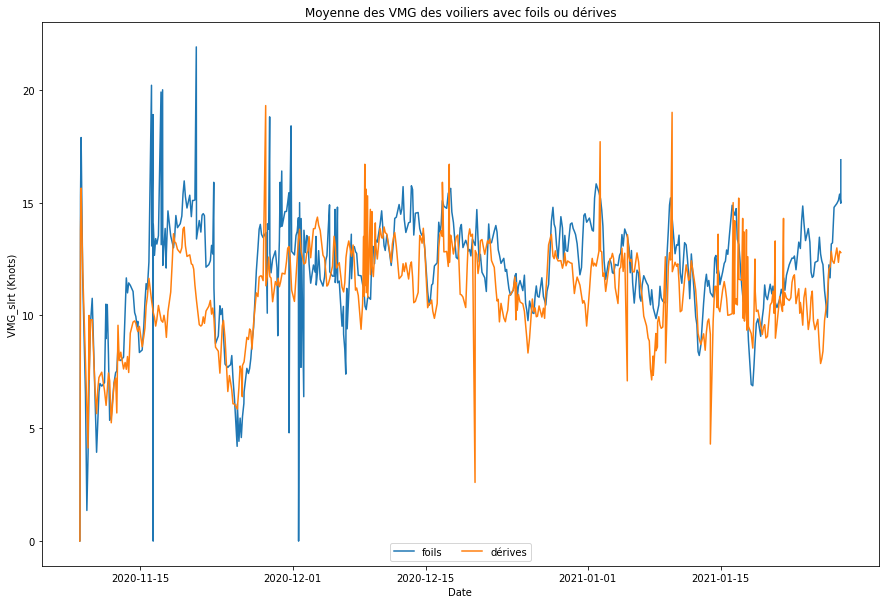

In [53]:
fig, ax = plt.subplots(figsize = (15,10));
sb.lineplot(x = 'Date', y = 'VMG_slrt (Knots)',data = df_No_RET, hue = 'Nombre de dérives ', ci= None)
ax.legend(ncol = 2, loc = 'lower center');
plt.title('Moyenne des VMG des voiliers avec foils ou dérives')
plt.show();

In [54]:
v1 = df_No_RET.loc[(df_No_RET['Nombre de dérives '] == 'dérives'),'VMG_slrt (Knots)'].mean()
v2 = df_No_RET.loc[(df_No_RET['Nombre de dérives '] == 'foils'),'VMG_slrt (Knots)'].mean()
print(f'la VMG des voiliers à derive est de {v1}')
print(f'la VMG des voiliers à foils est de {v2}')

la VMG des voiliers à derive est de 10.930285799790497
la VMG des voiliers à foils est de 11.8529822064057


Sur ce vendée globe, les voiliers à foils ont une VMG legèrement plus élevée que les bateaux à dérive.

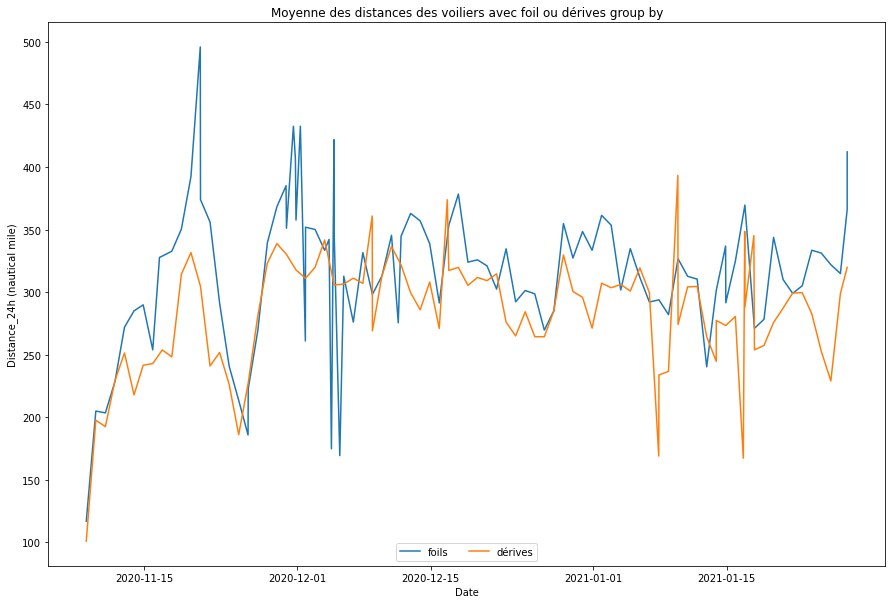

In [55]:
fig, ax = plt.subplots(figsize = (15,10));

sb.lineplot(x = 'Date', y = 'Distance_24h (nautical mile)',data = df_groupby_all, hue = 'Nombre de dérives ', ci= None)
ax.legend(ncol = 2, loc = 'lower center');
plt.title('Moyenne des distances des voiliers avec foil ou dérives group by')
plt.show();

In [56]:
d1 = df_groupby_all.loc[(df_groupby_all['Nombre de dérives '] == 'dérives'),'Distance_24h (nautical mile)'].mean()
d2 = df_groupby_all.loc[(df_groupby_all['Nombre de dérives '] == 'foils'),'Distance_24h (nautical mile)'].mean()
print(f'la dictance moyenne sur 24h voiliers à derive est de {d1}')
print(f'la distance moyenne sur 24h des voiliers à foils est de {d2}')

la dictance moyenne sur 24h voiliers à derive est de 281.3105075690114
la distance moyenne sur 24h des voiliers à foils est de 309.2166385135136


Nous pouvons essayer de réaliser une régression linéaire entre le classement (rang) et la vitesse utile (VMG) des voiliers et ainsi pouvoir prédire un classement en fonction d'un vitesse moyenne et inversement. 

In [57]:
df_groupby_VMG = df_No_RET.groupby('Skipper')['VMG_slrt (Knots)'].mean()
df_groupby_VMG = df_groupby_VMG.reset_index()
df_groupby_VMG = df_groupby_VMG.rename(columns={'VMG_slrt (Knots)': 'Total Mean VMG'})
df_groupby_VMG = pd.merge(df_all, df_groupby_VMG, on="Skipper",how="left")
df_groupby_VMG = df_groupby_VMG.groupby('Skipper').last().sort_index()
df_groupby_VMG = df_groupby_VMG.reset_index()

In [58]:
df_groupby_VMG = df_groupby_VMG.drop(df_groupby_VMG.index[df_groupby_VMG['Rank'] == 34])

In [59]:
from sklearn.linear_model import LinearRegression
X = df_groupby_VMG['Total Mean VMG'].to_numpy().reshape(-1, 1)
Y = df_groupby_VMG['Rank'].to_numpy()
reg = LinearRegression().fit(X, Y)
print(f'R2 = {reg.score(X, Y)}')

R2 = 0.9424720123102049


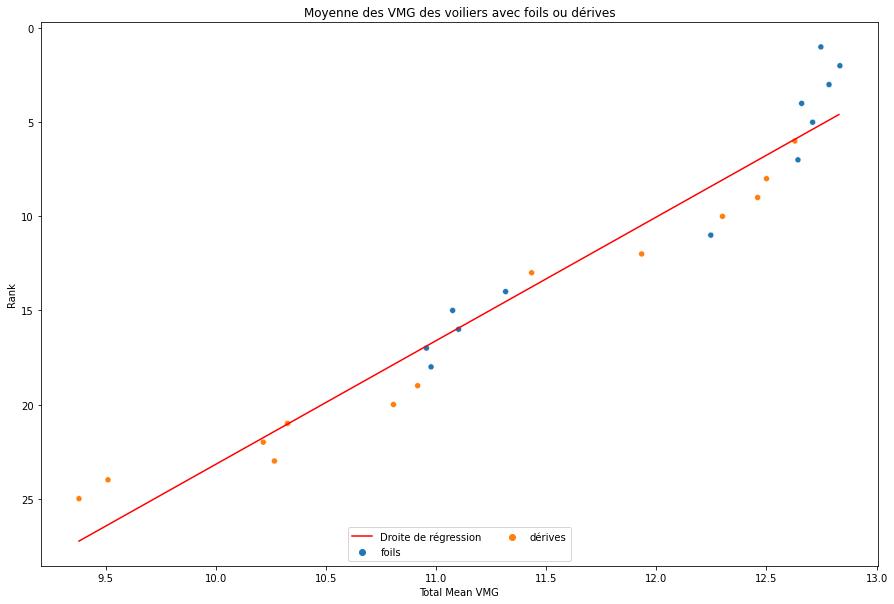

In [60]:
min = df_groupby_VMG['Total Mean VMG'].min()
max = df_groupby_VMG['Total Mean VMG'].max()


fig, ax = plt.subplots(figsize = (15,10));
sb.scatterplot(x = 'Total Mean VMG', y = 'Rank',data = df_groupby_VMG, hue = 'Nombre de dérives ', ci= None)

_ = plt.plot(np.arange(min, max, 0.01),  reg.intercept_ + reg.coef_[0] * np.arange(min, max, 0.01), 'r', label="Droite de régression")

ax.legend(ncol = 2, loc = 'lower center');

plt.gca().invert_yaxis()

plt.title('Moyenne des VMG des voiliers avec foils ou dérives')


plt.show();

Essayons quelques prédictions :

In [61]:
print(f'Pour une VMG de 8 le classement serait de {int(reg.predict([[8]])[0])}')
print(f'Pour une VMG de 12 le classement serait de {int(reg.predict([[12]])[0])}')
print(f'Pour une VMG de 14 le classement serait de {int(reg.predict([[14]])[0])}')

Pour une VMG de 8 le classement serait de 36
Pour une VMG de 12 le classement serait de 10
Pour une VMG de 14 le classement serait de -3


Pour la prédiction de 36 et -3 sont des classement qui n'existent pas dans notre cas. Il s'agit donc des places 33 (si il n'y a pas d'abandon) et 1.

### Conclusion 

En conclusion, nous pouvons bien evidemment noter des différences entre les voilier avec foils et avec dérives. Les voiliers avec foils sont en moyenne mieux classés, ont une meilleur VMG et ont parcourus en moyenne une plus grande distance.  
Cependant ce sont aussi ceux qui ont le plus abandonné. Ceci peut s'expliquer notament par la pus grande présence de voiliers à foils mais aussi car l'utilisation d'un foil rend la traversée plus dangereuse.   
Enfin, nus avons pu voir qu'il existait une correlation entre la VMG des voiliers et leur place dans la course ce qui explique le meilleur classement des voiliers à foils.
Nous nous sommes seulement concentré sur l'influence des foils, afin de pousser plus loin l'analyse,il serait judicieux de regarder les autres specificités des voiliers ainsi que qu'ajouter des information sur les pilotes.